In [1]:
import pandas as pd
import numpy as np
import json
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px
import re
import Levenshtein
from fuzzywuzzy import fuzz, process
from langdetect import detect
import spacy
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr
import statsmodels.api as sm
from statsmodels.formula.api import ols


In [2]:
data = pd.read_csv('fr.openfoodfacts.org.products.csv', delimiter='\t', encoding='utf-8')
#delimiter='\t' -> parce que les caractères sont séparés d'une tabulation 
#utf-8 -> parce que le document contient des caractères internationnaux
#information trouvé sur le txt partagé
data

C:\Users\DELL\AppData\Local\Temp\ipykernel_23688\3934535457.py:1: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('fr.openfoodfacts.org.products.csv', delimiter='\t', encoding='utf-8')


,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,16094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320767,9948282780603,http://world-fr.openfoodfacts.org/produit/9948...,openfoodfacts-contributors,1490631299,2017-03-27T16:14:59Z,1491244498,2017-04-03T18:34:58Z,Tomato & ricotta,NaN,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320768,99567453,http://world-fr.openfoodfacts.org/produit/9956...,usda-ndb-import,1489059076,2017-03-09T11:31:16Z,1491244499,2017-04-03T18:34:59Z,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
320769,9970229501521,http://world-fr.openfoodfacts.org/produit/9970...,tomato,1422099377,2015-01-24T11:36:17Z,1491244499,2017-04-03T18:34:59Z,乐吧泡菜味薯片,Leba pickle flavor potato chips,50 g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320770,9980282863788,http://world-fr.openfoodfacts.org/produit/9980...,openfoodfacts-contributors,1492340089,2017-04-16T10:54:49Z,1492340089,2017-04-16T10:54:49Z,Tomates aux Vermicelles,NaN,67g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
#Afficher toute les colonnes
pd.set_option('display.max_columns', None)

In [4]:
valManque = data.isnull().sum()
valManque

code                           23
url                            23
creator                         2
created_t                       3
created_datetime                9
                            ...  
carbon-footprint_100g      320504
nutrition-score-fr_100g     99562
nutrition-score-uk_100g     99562
glycemic-index_100g        320772
water-hardness_100g        320772
Length: 162, dtype: int64

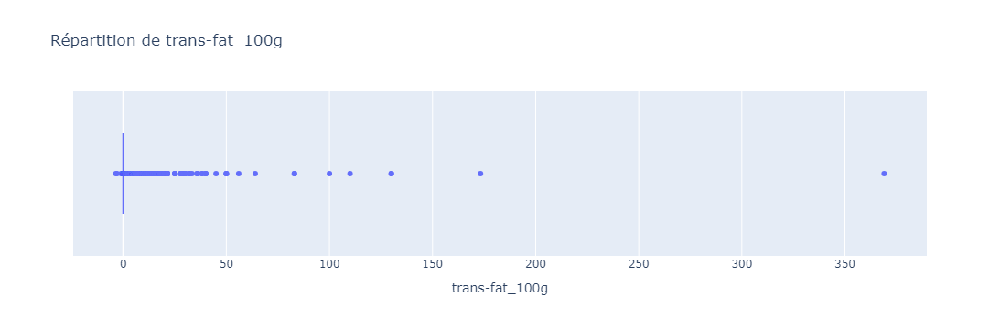

In [5]:
# Créez un graphique en boîte à moustaches avec Plotly
fig = px.box(data, x='trans-fat_100g', title="Répartition de trans-fat_100g")

# Affichez le graphique
fig.show()

# Nettoyage

In [6]:
#Suppression des variables à 100% de Val Manquante
data = data.dropna(axis=1, how='all')

## Valeurs aberrantes sur 100gr

In [7]:
#On renomme une colonne pour l'exclure de la manipulation suivante
data = data.rename(columns={'energy-from-fat_100g': 'energy-from-fat-100g'})
data = data.rename(columns={'energy_100g': 'energy-100g'})
data = data.rename(columns={'nutrition-score-fr_100g': 'nutrition-score-fr-100g'})
data = data.rename(columns={'nutrition-score-uk_100g': 'nutrition-score-uk-100g'})
data = data.rename(columns={'carbon-footprint_100g': 'carbon-footprint-100g'})


# liste de mots-clés que vous souhaitez rechercher dans les noms de colonnes
keywords = ['_100g']

# Parcourez les colonnes du DataFrame
for col_name in data.filter(like='_100g'):
    # Appliquez la transformation
    data[col_name] = data[col_name].apply(lambda x: x / 1000 if x > 100 else 0 if x < 0 else x)

## Simplification de l'huile de Palme 

In [8]:
#Fusion des colonnes lié à l'huile de palme et transformation en Booléen. 
# Créez une nouvelle colonne booléenne en utilisant la fonction `any` pour vérifier si au moins une des colonnes contient une valeur
data['PresenceHuilePalme'] = data[['ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_tags']].any(axis=1)

# Remplacez les valeurs booléennes True/False par 'oui'/'non'
data['PresenceHuilePalme'] = data['PresenceHuilePalme'].replace({True: '1', False: '0'})

# Supprimez les 2 colonnes d'origine
data = data.drop(['ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_tags'], axis=1)

## Création de la variable data France

In [9]:
# Test de 'countries_fr' pour verifier les fautes de frappes. 
mot_correct = 'France'

# Filtrer les valeurs nulles dans la colonne 'countries_fr'
donnees_non_nulles = [x for x in data['countries_fr'] if x is not None and isinstance(x, str)]

# Trouver les correspondances potentielles avec un score de similarité minimale de 80
resultats = process.extract(mot_correct, donnees_non_nulles, limit=20, scorer=fuzz.ratio)

# Afficher les résultats en excluant les correspondances parfaites (scores de 100)
for resultat in resultats:
    mot_potentiel, score = resultat
    
    if score < 100:  # Exclure les scores de 100
        print(f'Mot potentiel: {mot_potentiel}, Score de similarité: {score}')

In [10]:
dataFrance = data[data['countries_fr'].str.contains('France', case=False, na=False)]
dataFrance

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy-100g,energy-from-fat-100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,gondoic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint-100g,nutrition-score-fr-100g,nutrition-score-uk-100g,PresenceHuilePalme
0,3087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,NaN,NaN,Ferme t'y R'nao,ferme-t-y-r-nao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
46,24600,http://world-fr.openfoodfacts.org/produit/0000...,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,2015-06-17T10:11:54Z,Filet de bœuf,NaN,2.46 kg,plastique,plastique,NaN,NaN,Filet de bœuf,fr:filet-de-boeuf,Filet-de-boeuf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",fr:filet-de-boeuf,Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/00...,http://fr.openfoodfacts.org/images/products/00...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

## Doublons via 'code'

In [11]:
dataFrance.duplicated('code').sum()

4

In [12]:
dataFrance.loc[dataFrance['code'].duplicated(keep=False),:]

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy-100g,energy-from-fat-100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,gondoic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint-100g,nutrition-score-fr-100g,nutrition-score-uk-100g,PresenceHuilePalme
46,24600,http://world-fr.openfoodfacts.org/produit/0000...,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,2015-06-17T10:11:54Z,Filet de bœuf,NaN,2.46 kg,plastique,plastique,NaN,NaN,Filet de bœuf,fr:filet-de-boeuf,Filet-de-boeuf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",fr:filet-de-boeuf,Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/00...,http://fr.openfoodfacts.org/images/products/00...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
458,11778,http://world-fr.openfoodfacts.org/produit/0001...,gildubs,1490975915,2017-03-31T15:58:35Z,1490976772,2017-03-31T16:12:52Z,Stem Ginger Cookies,cookies au beurre à teneur réduite en matières...,225 g (10 cookies),plastique,plastique,Marks & Spencer,marks-spencer,Cookies,"en:sugary-snacks,en:biscuits-and-cakes,en:bisc...","Snacks sucrés,Biscuits et gâteaux,Biscuits,Coo...",NaN,NaN,Royaume Uni,royaume-uni,"Allégé en matière grasse,Végétarien,Moins 30% ...","en:low-or-no-fat,en:vegetarian,en:low-fat,en:3...","Peu ou pas de matière grasse,Végétarien,Peu de...",NaN,NaN,NaN,NaN,NaN,France,Marks & Spencer,"France,Belgique,Pays-Bas,Royaume-Uni","en:belgium,en:france,en:netherlands,en:united-...","Belgique,France,Pays-Ba

In [13]:
# Parcourez le DataFrame et effectuez la fusion conditionnelle
for index, row in dataFrance.iterrows():
    if row['code'] == 722810:
        # Récupérez l'indice de l'autre individu avec le même 'code'
        other_index = dataFrance[(dataFrance['code'] == 722810) & (dataFrance.index != index)].index

        if len(other_index) > 0:
            other_index = other_index[0]  # Prenez le premier indice trouvé

            # Parcourez les colonnes et remplacez les valeurs manquantes
            for column in dataFrance.columns:
                if pd.notna(row[column]) and pd.isna(dataFrance.at[other_index, column]):
                    dataFrance.at[other_index, column] = row[column]
                    
for index, row in dataFrance.iterrows():
    if row['code'] == 635646:
        # Récupérez l'indice de l'autre individu avec le même 'code'
        other_index2 = dataFrance[(dataFrance['code'] == 635646) & (dataFrance.index != index)].index

        if len(other_index2) > 0:
            other_index2 = other_index2[0]  # Prenez le premier indice trouvé

            # Parcourez les colonnes et remplacez les valeurs manquantes
            for column in dataFrance.columns:
                if pd.notna(row[column]) and pd.isna(dataFrance.at[other_index2, column]):
                    dataFrance.at[other_index2, column] = row[column] 

for index, row in dataFrance.iterrows():
    if row['code'] == 11778:
        # Récupérez l'indice de l'autre individu avec le même 'code'
        other_index3 = dataFrance[(dataFrance['code'] == 11778) & (dataFrance.index != index)].index

        if len(other_index3) > 0:
            other_index3 = other_index3[0]  # Prenez le premier indice trouvé

            # Parcourez les colonnes et remplacez les valeurs manquantes
            for column in dataFrance.columns:
                if pd.notna(row[column]) and pd.isna(dataFrance.at[other_index3, column]):
                    dataFrance.at[other_index3, column] = row[column]
                    
for index, row in dataFrance.iterrows():
    if row['code'] == 24600:
        # Récupérez l'indice de l'autre individu avec le même 'code'
        other_index4 = dataFrance[(dataFrance['code'] == 24600) & (dataFrance.index != index)].index

        if len(other_index4) > 0:
            other_index4 = other_index4[0]  # Prenez le premier indice trouvé

            # Parcourez les colonnes et remplacez les valeurs manquantes
            for column in dataFrance.columns:
                if pd.notna(row[column]) and pd.isna(dataFrance.at[other_index4, column]):
                    dataFrance.at[other_index4, column] = row[column]
                    
dataFrance.loc[dataFrance['code'].duplicated(keep=False),:]

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy-100g,energy-from-fat-100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,gondoic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint-100g,nutrition-score-fr-100g,nutrition-score-uk-100g,PresenceHuilePalme
46,24600,http://world-fr.openfoodfacts.org/produit/0000...,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,2015-06-17T10:11:54Z,Filet de bœuf,NaN,2.46 kg,plastique,plastique,NaN,NaN,Filet de bœuf,fr:filet-de-boeuf,Filet-de-boeuf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",fr:filet-de-boeuf,Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/00...,http://fr.openfoodfacts.org/images/products/00...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
458,11778,http://world-fr.openfoodfacts.org/produit/0001...,gildubs,1490975915,2017-03-31T15:58:35Z,1490976772,2017-03-31T16:12:52Z,Stem Ginger Cookies,cookies au beurre à teneur réduite en matières...,225 g (10 cookies),plastique,plastique,Marks & Spencer,marks-spencer,Cookies,"en:sugary-snacks,en:biscuits-and-cakes,en:bisc...","Snacks sucrés,Biscuits et gâteaux,Biscuits,Coo...",NaN,NaN,Royaume Uni,royaume-uni,"Allégé en matière grasse,Végétarien,Moins 30% ...","en:low-or-no-fat,en:vegetarian,en:low-fat,en:3...","Peu ou pas de matière grasse,Végétarien,Peu de...",NaN,NaN,NaN,NaN,NaN,France,Marks & Spencer,"France,Belgique,Pays-Bas,Royaume-Uni","en:belgium,en:france,en:netherlands,en:united-...","Belgique,France,Pays-Ba

In [14]:
# Indice de la ligne que vous souhaitez examiner
indice_ligne = 9892

# Calculer le taux de valeurs manquantes pour la ligne spécifiée
ligne = dataFrance.iloc[indice_ligne]
total_columns = len(dataFrance.columns)
taux_valeurs_manquantes = ligne.isnull().sum() / total_columns

# Afficher le taux de valeurs manquantes pour la ligne spécifiée
print(f"Taux de valeurs manquantes pour la ligne {indice_ligne}: {taux_valeurs_manquantes}")

Taux de valeurs manquantes pour la ligne 9892: 0.896551724137931


In [15]:
# Indices des lignes à supprimer
indices_a_supprimer = [519, 9892, 80034, 67371]

# Supprimez les lignes avec les indices spécifiés
dataFrance = dataFrance.drop(indices_a_supprimer)

#### Suppression des lignes avec des ValM dans 'product_name'

In [16]:
dataFrance = dataFrance.dropna(subset=['product_name'])

#### Suppression des lignes boissons alcoolisées 

In [17]:
# Remplacez les valeurs manquantes (NaN) par une chaîne vide
dataFrance['categories'] = dataFrance['categories'].fillna('')

# Supprimez les individus (lignes) contenant les termes spécifiés dans la colonne 'categories'
mots_cles_a_supprimer = ['Boissons alcoolisées', 'vins', 'alcool']
dataFrance = dataFrance[~dataFrance['categories'].str.contains('|'.join(mots_cles_a_supprimer), case=False)]

# Réinitialisez les index si nécessaire
dataFrance = dataFrance.reset_index(drop=True)

#### Nettoyage Allergène

## Simplification de colonne

#### Fusion

In [18]:
def fusionner_colonnes(dataframe, colonne_source, colonne_destination):
    # Condition : Si la colonne source a une valeur et la colonne destination est manquante, remplacez la colonne destination par la colonne source
    mask = (dataframe[colonne_source].notna()) & (dataframe[colonne_destination].isna())
    dataframe.loc[mask, colonne_destination] = dataframe[colonne_source]
    
# Liste des paires de colonnes à fusionner
paires_colonnes = [
    ('packaging', 'packaging_tags'),
    ('brands', 'brands_tags'),
    ('origins', 'origins_tags'),
    ('manufacturing_places', 'manufacturing_places_tags'),
    ('emb_codes', 'emb_codes_tags'),
    ('image_small_url', 'image_url')]

# Appliquez la fusion pour chaque paire de colonnes
for source, destination in paires_colonnes:
    fusionner_colonnes(dataFrance, source, destination)
    
# Liste des triplettes de colonnes à fusionner
triplettes_colonnes = [
    ('labels', 'labels_tags', 'labels_fr'),
    ('traces', 'traces_tags', 'traces_fr'),
    ('categories', 'categories_tags', 'categories_fr')]

# Appliquez la fusion pour chaque triplette de colonnes
for source1, source2, destination in triplettes_colonnes:
    fusionner_colonnes(dataFrance, source1, destination)
    fusionner_colonnes(dataFrance, source2, destination)

#### Suppression de colonne 

In [19]:
# Liste des noms de colonnes à supprimer
colonnes_a_supprimer = ['pnns_groups_1','pnns_groups_2','cities','packaging','brands','origins','manufacturing_places',
                        'emb_codes','image_small_url','labels','labels_tags','categories','categories_tags',
                       'traces','traces_tags']

# Supprimez les colonnes spécifiées
dataFrance = dataFrance.drop(columns=colonnes_a_supprimer)

dataFrance

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging_tags,brands_tags,categories_fr,origins_tags,manufacturing_places_tags,labels_fr,emb_codes_tags,first_packaging_code_geo,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces_fr,serving_size,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,states,states_tags,states_fr,main_category,main_category_fr,image_url,energy-100g,energy-from-fat-100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,gondoic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint-100g,nutrition-score-fr-100g,nutrition-score-uk-100g,PresenceHuilePalme
0,3087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,NaN,ferme-t-y-r-nao,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,24600,http://world-fr.openfoodfacts.org/produit/0000...,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,2015-06-17T10:11:54Z,Filet de bœuf,NaN,2.46 kg,plastique,NaN,Filet-de-boeuf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",fr:filet-de-boeuf,Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/00...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,36252,http://world-fr.openfoodfacts.org/produit/0000...,tacinte,1422221701,2015-01-25T21:35:01Z,1489055667,2017-03-09T10:34:27Z,Lion Peanut x2,NaN,NaN,NaN,sunridge,,NaN,NaN,NaN,NaN,NaN,NaN,"Roissy,France",NaN,"France, US","en:f

## Exploration variable avec +50% de ValM

In [20]:
seuil = 0.5 * len(dataFrance)
seuil_max = len(dataFrance)
observationVM1 = dataFrance[dataFrance.columns[(dataFrance.isnull().sum() >= seuil) & (dataFrance.isnull().sum() < seuil_max)]]

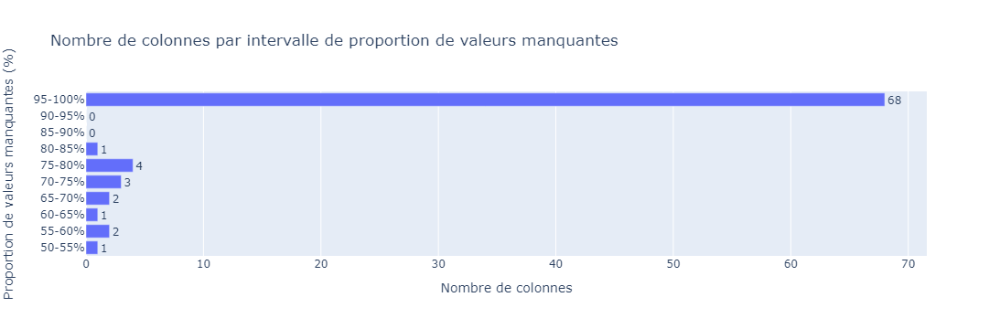

In [21]:
ProportionValM = observationVM1.isnull().mean()
intervals = [(i, i + 5) for i in range(50, 100, 5)]
ProportionValM = ProportionValM[ProportionValM < 1.0]

graph_data = pd.DataFrame({
    'Proportion de valeurs manquantes': ProportionValM.values * 100,})

graph_data['Interval'] = pd.cut(graph_data['Proportion de valeurs manquantes'], bins=[i[0] for i in intervals] + [100], labels=[f'{i[0]}-{i[1]}%' for i in intervals])
count_data = graph_data['Interval'].value_counts().sort_index().reset_index()
count_data.columns = ['Interval', 'Nombre de colonnes']

# Créez le graphique en barres avec Plotly
fig = px.bar(
    count_data,
    x='Nombre de colonnes',
    y='Interval',
    orientation='h',  # Barres horizontales
    labels={'Nombre de colonnes': 'Nombre de colonnes', 'Interval': 'Proportion de valeurs manquantes (%)'},
    title='Nombre de colonnes par intervalle de proportion de valeurs manquantes'
)
fig.update_traces(texttemplate='%{x}', textposition='outside')


# Affichez le graphique
fig.show()

In [22]:
colonnes = observationVM1.columns.tolist()
print(colonnes)

# 71 variables _100g et -100gr et 14 autres variables

['generic_name', 'origins_tags', 'manufacturing_places_tags', 'labels_fr', 'emb_codes_tags', 'first_packaging_code_geo', 'cities_tags', 'purchase_places', 'stores', 'allergens', 'traces_fr', 'serving_size', 'additives_tags', 'additives_fr', 'energy-from-fat-100g', 'lauric-acid_100g', 'arachidic-acid_100g', 'montanic-acid_100g', 'monounsaturated-fat_100g', 'polyunsaturated-fat_100g', 'omega-3-fat_100g', 'alpha-linolenic-acid_100g', 'eicosapentaenoic-acid_100g', 'docosahexaenoic-acid_100g', 'omega-6-fat_100g', 'linoleic-acid_100g', 'arachidonic-acid_100g', 'gamma-linolenic-acid_100g', 'omega-9-fat_100g', 'oleic-acid_100g', 'trans-fat_100g', 'cholesterol_100g', 'sucrose_100g', 'glucose_100g', 'fructose_100g', 'lactose_100g', 'maltose_100g', 'maltodextrins_100g', 'starch_100g', 'polyols_100g', 'casein_100g', 'serum-proteins_100g', 'nucleotides_100g', 'alcohol_100g', 'vitamin-a_100g', 'beta-carotene_100g', 'vitamin-d_100g', 'vitamin-e_100g', 'vitamin-k_100g', 'vitamin-c_100g', 'vitamin-b1_1

### Essaie du Machine Learning

In [23]:
for col in dataFrance.columns:
     #Si le type de la colonne est un objet (chaîne de caractères), remplacer les valeurs manquantes par 'Abs'
    if dataFrance[col].dtype == 'O':  # 'O' est le code pour le type d'objet
        dataFrance[col] = dataFrance[col].fillna('Abs')
     #Si le type de la colonne est un entier ou un flottant, remplacer les valeurs manquantes par 0
    if dataFrance[col].dtype in ['int64', 'float64']:  # 'int64' et 'float64' sont les types d'entier et de flottant
        dataFrance[col] = dataFrance[col].fillna(0)

In [24]:
def convert_nutrition_grade(grade):
    mapping = {'a': 1, 'b': 2, 'c': 3, 'd': 4, 'e': 5}
    return mapping.get(grade, None)  # Retourne None si la note n'est pas trouvée

# Appliquer la fonction de conversion à la colonne 'nutrition_grade_fr'
dataFrance['nutrition_grade_fr'] = dataFrance['nutrition_grade_fr'].apply(convert_nutrition_grade)

In [25]:
# Séparation du jeu de données en deux parties
dataFrance_with_y = dataFrance.dropna(subset=['nutrition_grade_fr'])
dataFrance_without_y = dataFrance[dataFrance['nutrition_grade_fr'].isna()]

# Définition de X_train et y_train
X_train = dataFrance_with_y[['salt_100g', 'proteins_100g', 'fiber_100g', 'sugars_100g', 'carbohydrates_100g', 'saturated-fat_100g', 'fat_100g', 'energy-100g']]
y_train = dataFrance_with_y['nutrition_grade_fr']


In [26]:
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression

# Création de l'imputer
imputer = SimpleImputer(strategy='mean')  # Vous pouvez choisir 'median' ou une autre stratégie si nécessaire

# Application de l'imputation sur X_train
X_train_imputed = imputer.fit_transform(X_train)

# Entraînement du modèle sur les données imputées
model = LinearRegression()
model.fit(X_train_imputed, y_train)

# Utiliser le modèle pour prédire les valeurs manquantes de y
X_missing = dataFrance_without_y[['salt_100g', 'proteins_100g', 'fiber_100g', 'sugars_100g', 'carbohydrates_100g', 'saturated-fat_100g', 'fat_100g', 'energy-100g']]
X_missing_imputed = imputer.transform(X_missing)  # Utiliser le même imputer pour garantir la cohérence
predicted_y = model.predict(X_missing_imputed)

# Utiliser le modèle pour prédire les valeurs manquantes de y
predicted_y = model.predict(X_missing_imputed)

# Arrondir les prédictions au chiffre supérieur et appliquer les contraintes de plage
predicted_y_rounded = np.ceil(predicted_y)
predicted_y_constrained = np.clip(predicted_y_rounded, 1, 5)

# Ajouter les prédictions ajustées à l'ensemble de données sans y
dataFrance_without_y['nutrition_grade_fr'] = predicted_y_constrained

# Combiner les deux parties du jeu de données
dataFrance = pd.concat([dataFrance_with_y, dataFrance_without_y])


In [27]:
dataFrance

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging_tags,brands_tags,categories_fr,origins_tags,manufacturing_places_tags,labels_fr,emb_codes_tags,first_packaging_code_geo,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces_fr,serving_size,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,states,states_tags,states_fr,main_category,main_category_fr,image_url,energy-100g,energy-from-fat-100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,gondoic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint-100g,nutrition-score-fr-100g,nutrition-score-uk-100g,PresenceHuilePalme
2,36252,http://world-fr.openfoodfacts.org/produit/0000...,tacinte,1422221701,2015-01-25T21:35:01Z,1489055667,2017-03-09T10:34:27Z,Lion Peanut x2,Abs,Abs,Abs,sunridge,,Abs,Abs,Abs,Abs,Abs,Abs,"Roissy,France",Abs,"France, US","en:france,en:united-states","France,États-Unis","Milk chocolate coating (evaporated cane juice,...",Abs,Abs,Abs,40 g (0.25 cup),1.0,[ milk-chocolate-coating -> en:milk-chocolate...,en:e322,E322 - Lécithines,0.0,0.0,5.0,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",Abs,Abs,http://fr.openfoodfacts.org/images/products/00...,1883.0,0.0,20.0,12.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.012,70.0,57.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,2.5,0.0,0.0,0.0,0.09652,0.038000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0009,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.0,22.0,0
9,10187319,http://world-fr.openfoodfacts.org/produit/0000...,kiliweb,1487325954,2017-02-17T10:05:54Z,1487325954,2017-02-17T10:05:54Z,Mini Confettis,Abs,Abs,Abs,alice-delice,,Abs,Abs,Abs,Abs,Abs,Abs,Abs,Abs,France,en:france,France,Abs,Abs,Abs,Abs,Abs,0.0,Abs,Abs,Abs,0.0,0.0,4.0,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",Abs,Abs,Abs,1753.0,0.0,0.0,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,87.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.9,0.6,0.0,0.0,0.0,0.01000,0.003937,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,14.0,0
10,10207260,http://world-fr.openfoodfacts.org/produit/0000...,kiliweb,1490203031,2017

In [28]:
def nettoyer_allergenes(cellule):
    if isinstance(cellule, str):  # Vérifiez si la cellule est une chaîne de caractères
        
        # Convertissez tous les termes en minuscules
        cellule = cellule.lower()
        
        # Utilisez une expression régulière pour standardiser la séparation par ", " (virgule suivie d'un espace)
        cellule = re.sub(r'\s*,\s*', ', ', cellule)
        
         # Remplacez les termes spécifiques.
        cellule = cellule.replace("crème", "lait").replace("beurre", "lait").replace("fromage", "lait").replace("laitier", "lait").replace("ricotta","lait").replace("grana padano aop","lait").replace("chapelure","blé").replace("saumon atlantique","poissons").replace("oeufs","œufs").replace("oeuf","œufs").replace("emmental","lait").replace("yaourts","lait").replace("œuf","œufs").replace("œufss","œufs").replace("cheddar","lait").replace("laits","lait").replace("yaourt","lait").replace("lactose","lait").replace("saumon","poissons").replace("thon","poissons").replace("noisette","noisettes").replace("noisettess","noisettes").replace("lactosérum","lait").replace("crustacé","crustacés").replace("colin d'alaska","poissons").replace("chair de homard américain","crustacés").replace("crustacéss","crustacés").replace("creme","lait").replace("amande","amandes").replace("amandess","amandes").replace("froment","blé").replace("gouda","lait").replace("lait fraiche","lait").replace("ble","blé").replace("céléri","céléri").replace("dioxyde de soufre","sulfites").replace("cabillaud","poissons").replace("langoustines","crustacés").replace("homard","crustacés").replace("arachide","arachides").replace("mozzarella","lait").replace("laitblanc","lait").replace("maquereaux","poissons").replace("laitdechèvre","lait").replace("poisson","poissons").replace("morue","poissons").replace("laitière","lait").replace("sondeblé","blé").replace("laitrum","lait").replace("arachidessssss","arachides").replace("mascarpone","lait").replace("laitpecorino","lait").replace("moutardededijon","moutarde").replace("poissonsssss","poissons").replace("mozarella","lait").replace("edam","lait").replace("hareng","poissons").replace("grainesdesésame","sésame").replace("laitfraîche","lait").replace("granapadano","lait").replace("pecorinoromano","lait").replace("maquereau","poissons").replace("anhydridesulfureux","sulfites").replace("disulfite","sulfites").replace("poissonssss","poissons").replace("roquefort","lait").replace("sulfite","sulfites").replace("sulfitesdepotassium","sulfites").replace("grainesdemoutarde","moutarde").replace("lupine","lupin").replace("sulfitesss","sulfites").replace("moules","mollusques").replace("parmigianoreggiano","lait").replace("protéinesdelait","lait").replace("poissons**","poissons").replace("moutardes","moutarde").replace("métabisulfitess","sulfites").replace("sulfitesdepotassium","sulfites").replace("matièregrasselait","lait").replace("matièregrasselaitanhydre","lait").replace("laitécrémé","lait").replace("laitentier","lait").replace("laitfrais","lait").replace("poissonsalbacore","poissons").replace("poissonblanc","poissons").replace("poissonss","poissons").replace("saint-jacques","mollusques").replace("laitdoux","lait").replace("sulfitess","sulfites").replace("mimolette","lait").replace("lactiques","lait").replace("mollusque","mollusques").replace("comté","lait").replace("disulﬁte","sulfites").replace("anchois","poissons").replace("crevette","crustacés").replace("petit épeautre","épeautre").replace("raclette","lait").replace("lécithine de soja","soja").replace("provolone","lait").replace("arachidesss","arachides").replace("graines de","sésames").replace("çrème","lait").replace("œufs de poule","œufs").replace("vin","sulfites").replace("mollusquessssss","mollusques").replace("sulfates","sulfites").replace("méta bisulfites","sulfites").replace("tome fraîche","lait").replace("lait fraîche","lait").replace("sulfate","sulfites").replace("œufs*","œufs").replace("bié","blé").replace("mollusquess","mollusques").replace("sésames moutarde","sésames, moutarde").replace("sésame","sésames").replace("beaufort","lait").replace("blancs d’œufs","œufs").replace("blé dur","blé").replace("arachidess","arachides").replace("poudre de lait","lait").replace("poudre de lait entier","lait").replace("poulpe","mollusques").replace("protéine de soja","soja").replace("protéines de lait","lait").replace("lait écrémé","lait").replace("saint jacques","mollusques").replace("parmesan","lait").replace("lait râpé","lait").replace("merlu","poissons").replace("lieu","poissons").replace("poissons**","poissons").replace("poissons de roche","poissons").replace("rouget","poissons").replace("lait entier en poudre","lait").replace("lait en poudre","lait").replace("lait doux","lait").replace("lait demi-sel","lait").replace("protéines du lait","lait").replace("lait aigre","lait").replace("jaunes d'œufs en poudre","œufs").replace("sésamesssssssss sésamessssssss","sésames").replace("ialt","lait").replace("lait fondu","lait").replace("iactosèrum","lait").replace("fromagère","lait").replace("pâtes","blé").replace("blé é","blé").replace("sulfites de potassium","sulfites").replace("grana padano","lait").replace("gluten de blé","blé").replace("sésamesss sésamess","sésames").replace("gorgonzola","lait").replace("jaune d’œufs","œufs").replace("hydrolysat dede soja","soja").replace("sésamesss","sésames").replace("butyrique","lait").replace("dérivés de lait","lait").replace("lait de cacao","lait").replace("matière grasse lait","lait").replace("graine de sésames","sésames").replace("d'œufs","œufs").replace("d'orge et de seigle","orge, seigle").replace("d'épautre","épautre").replace("céphalopode","mollusques").replace("sésamess","sésames").replace("lait*","lait").replace("proits lait","lait").replace("gambas","crustacés").replace("lait cru de brebis","lait").replace("lait blanc","lait").replace("sardines","poissons").replace("d'orge","orge").replace("cacahuètes","cacahuète").replace("lalt","lait").replace("lactique","lait").replace("semoule","blé").replace("semoule de blé*","blé").replace("blé*","blé").replace("lait concentré","lait").replace("d’œufs","œufs").replace("lait frais","lait").replace("amandes effilées","amandes").replace("truite","poissons").replace("lait entier","lait").replace("limande","poissons").replace("lait de chèvre","lait").replace("d'avoine","avoine").replace("albumine de lait","lait").replace("ferment lait","lait").replace("maasdam","lait").replace("crabe","crustacés").replace("encornet géant","mollusques").replace("tourteau","poissons").replace("sésames sésames","sésames").replace("œufs frais","œufs").replace("colin d' alaska","poissons").replace("farine de blé","blé").replace("carpe","poissons").replace("cantal","lait").replace("amidon de blé","blé").replace("crustacéss","crustacés").replace("noixbrésil","noix du brésil").replace("crustace","crustacés").replace("colin","poissons").replace("noix de st jacques","mollusques").replace("caséinate","lait").replace("poissons d‘alaska*","poissons").replace("soja*","soja").replace("bisulfites","sulfites").replace("bisulﬁte de sodium","sulfites").replace("sulﬁtes","sulfites").replace("surimi","poissons")
        
         # Supprimez les termes qui sont des erreurs
        termes_a_supprimer = ["ingrédients :","cornflakes","paprika", "coriandre", "anhydride sulfureux", "bléu", "lysozyme", "couscous", "garniture", "bûchette", "feuilletée", "e471","contenant","du","protéines", "balait","vinaigred'alcool","  ","porc", " preparation de viande bovine hachée cuite","protéines solublés","noixdecoco","sauce","malt","arômes","tournesol","huile butyrique"]  # Remplacez ces termes par les termes réels que vous voulez supprimer
        for terme in termes_a_supprimer:
            cellule = cellule.replace(terme, "")   
            
        # les allergènes sont séparés par des virgules et un espace
        allergenes = cellule.split(", ") 
        allergenes_uniques = list(set(allergenes))  # Convertissez la liste en ensemble pour éliminer les doublons
        return ", ".join(allergenes_uniques)  # Rejoignez à nouveau les allergènes uniques en une chaîne
    else:
        return "Abs"  # Remplacez les valeurs non-chaînes (comme les NaN) par une chaîne vide
    
# Appliquez la fonction à la colonne "Allergenes" et remplacez les valeurs NaN par une chaîne vide
dataFrance["allergens"] = dataFrance["allergens"].apply(nettoyer_allergenes)

# Ajoutez une nouvelle colonne 'Nbr_Allergenes' en comptant le nombre d'allergènes dans la colonne "Allergenes"
dataFrance['Nbr_Allergenes'] = dataFrance['allergens'].str.count(',') + 1

# Remplacez les valeurs dans la colonne 'Nbr_Allergenes' par 0 lorsque la valeur correspondante dans la colonne 'Allergenes' est 'Abs'
dataFrance.loc[dataFrance['allergens'].str.lower() == 'abs', 'Nbr_Allergenes'] = 0

# Supprimez les lignes avec 'Nbr_Allergenes' supérieur à 15
dataFrance = dataFrance[dataFrance['Nbr_Allergenes'] <= 15]

# Appliquez la fonction à la colonne "Allergenes" et remplacez les valeurs NaN par une chaîne vide
dataFrance["allergens"] = dataFrance["allergens"].apply(nettoyer_allergenes)

C:\Users\DELL\AppData\Local\Temp\ipykernel_23688\3362310056.py:29: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



## Création de variables / Nutriscore

In [29]:
dataFrance.groupby('Nbr_Allergenes')['code'].count()

Nbr_Allergenes
0     67530
1      9625
2      5050
3      3942
4      2204
5      1011
6       403
7       150
8        57
9        22
10       14
11        6
12        5
14        1
15        1
Name: code, dtype: int64

In [30]:
dataFrance['PresenceAllergenes'] = dataFrance['Nbr_Allergenes'].ne(0)
dataFrance.groupby('PresenceAllergenes')['code'].count()

PresenceAllergenes
False    67530
True     22491
Name: code, dtype: int64

In [31]:
nutriA = dataFrance[dataFrance['nutrition_grade_fr'] == 1]
nutriB = dataFrance[dataFrance['nutrition_grade_fr'] == 2]
nutriC = dataFrance[dataFrance['nutrition_grade_fr'] == 3]
nutriD = dataFrance[dataFrance['nutrition_grade_fr'] == 4]
nutriE = dataFrance[dataFrance['nutrition_grade_fr'] == 5]

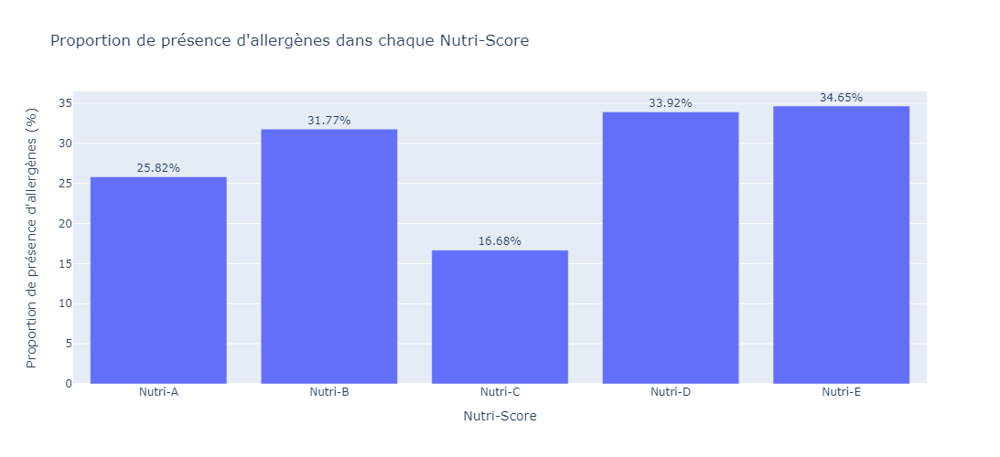

In [32]:
nutri_data = {
    'Nutri-A': nutriA,
    'Nutri-B': nutriB,
    'Nutri-C': nutriC,
    'Nutri-D': nutriD,
    'Nutri-E': nutriE
}

# Créez un dictionnaire pour stocker les proportions de 'True' pour chaque variable
proportions = {}
total_true_values = {}

# Calculer les proportions et les totaux de 'True' pour chaque variable
for var_name, var_df in nutri_data.items():
    proportion = (var_df['PresenceAllergenes'].sum() / len(var_df)) * 100
    proportions[var_name] = round(proportion, 2)  # Arrondi à deux décimales
    total_true_values[var_name] = var_df['PresenceAllergenes'].sum()

# Créez un DataFrame à partir du dictionnaire de proportions
proportions_df = pd.DataFrame(list(proportions.items()), columns=['Nutri-Score', 'Proportion de présence d\'allergènes (%)'])
proportions_df['Total True'] = list(total_true_values.values())

# Créez un graphique à barres avec Plotly et ajoutez le texte pour les pourcentages arrondis
fig = px.bar(proportions_df, x='Nutri-Score', y='Proportion de présence d\'allergènes (%)', text='Proportion de présence d\'allergènes (%)',
             title="Proportion de présence d'allergènes dans chaque Nutri-Score")
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
fig.update_layout(height=500, yaxis_title='Proportion de présence d\'allergènes (%)')

fig.show()

## Univariés

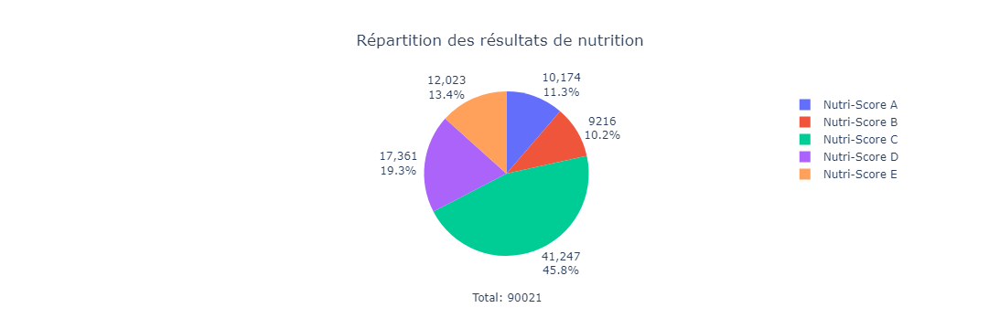

In [33]:
# Calcul du nombre total de chaque résultat dans 'nutrition_grade_fr'
result_counts = dataFrance['nutrition_grade_fr'].value_counts()

# Création du DataFrame pour le Pie Chart
pie_data = pd.DataFrame({
    'Résultat': result_counts.index,
    'Nombre Total': result_counts.values})

# Définir des étiquettes personnalisées pour la légende
labels = {
    1: 'Nutri-Score A',
    2: 'Nutri-Score B',
    3: 'Nutri-Score C',
    4: 'Nutri-Score D',
    5: 'Nutri-Score E'
}

# Mapper les valeurs numériques aux étiquettes dans le DataFrame
pie_data['Résultat'] = pie_data['Résultat'].map(labels)
pie_data = pie_data.sort_values(by='Résultat')

# Création du Pie Chart avec Plotly Express
fig = px.pie(pie_data, 
             names='Résultat', 
             values='Nombre Total',
             title='Répartition des résultats de nutrition',
             template='plotly_white',
             category_orders={'Résultat': list(labels.values())})


# Ajouter les étiquettes de données personnalisées
fig.update_traces(textposition='outside', textinfo='value+percent')
fig.update_layout(title=dict(x=0.5))
total = pie_data['Nombre Total'].sum()
fig.add_annotation(
    text=f'Total: {total}',
    x=0.5,
    y=-0.3, 
    showarrow=False,
    font=dict(size=12))

# Afficher le Pie Chart
fig.show()

In [34]:
moyenne_NbrAllA = nutriA['Nbr_Allergenes'].mean()
moyenne_NbrAllA

0.4603892274425005

In [35]:
moyenne_NbrAllB = nutriB['Nbr_Allergenes'].mean()
moyenne_NbrAllB

0.6608072916666666

In [36]:
moyenne_NbrAllC = nutriC['Nbr_Allergenes'].mean()
moyenne_NbrAllC

0.36109292797051906

In [37]:
moyenne_NbrAllD = nutriD['Nbr_Allergenes'].mean()
moyenne_NbrAllD

0.7579632509648062

In [38]:
moyenne_NbrAllE = nutriE['Nbr_Allergenes'].mean()
moyenne_NbrAllE

0.9159111702570074

In [39]:
# Calculer la moyenne des valeurs de A
moyenne_fiberA = nutriA['fiber_100g'].mean()
moyenne_saltA = nutriA['salt_100g'].mean()
moyenne_proteinsA = nutriA['proteins_100g'].mean()
moyenne_sugarA = nutriA['sugars_100g'].mean()
moyenne_saturedfatA = nutriA['saturated-fat_100g'].mean()
moyenne_fatA = nutriA['fat_100g'].mean()
moyenne_carbohydratesA = nutriA['carbohydrates_100g'].mean()

# Calculer la moyenne des valeurs de B
moyenne_fiberB = nutriB['fiber_100g'].mean()
moyenne_saltB = nutriB['salt_100g'].mean()
moyenne_proteinsB = nutriB['proteins_100g'].mean()
moyenne_sugarB = nutriB['sugars_100g'].mean()
moyenne_saturedfatB = nutriB['saturated-fat_100g'].mean()
moyenne_fatB = nutriB['fat_100g'].mean()
moyenne_carbohydratesB = nutriB['carbohydrates_100g'].mean()

# Calculer la moyenne des valeurs de C
moyenne_fiberC = nutriC['fiber_100g'].mean()
moyenne_saltC = nutriC['salt_100g'].mean()
moyenne_proteinsC = nutriC['proteins_100g'].mean()
moyenne_sugarC = nutriC['sugars_100g'].mean()
moyenne_saturedfatC = nutriC['saturated-fat_100g'].mean()
moyenne_fatC = nutriC['fat_100g'].mean()
moyenne_carbohydratesC = nutriC['carbohydrates_100g'].mean()

# Calculer la moyenne des valeurs de D
moyenne_fiberD = nutriD['fiber_100g'].mean()
moyenne_saltD = nutriD['salt_100g'].mean()
moyenne_proteinsD = nutriD['proteins_100g'].mean()
moyenne_sugarD = nutriD['sugars_100g'].mean()
moyenne_saturedfatD = nutriD['saturated-fat_100g'].mean()
moyenne_fatD = nutriD['fat_100g'].mean()
moyenne_carbohydratesD = nutriD['carbohydrates_100g'].mean()

# Calculer la moyenne des valeurs de E
moyenne_fiberE = nutriE['fiber_100g'].mean()
moyenne_saltE = nutriE['salt_100g'].mean()
moyenne_proteinsE = nutriE['proteins_100g'].mean()
moyenne_sugarE = nutriE['sugars_100g'].mean()
moyenne_saturedfatE = nutriE['saturated-fat_100g'].mean()
moyenne_fatE = nutriE['fat_100g'].mean()
moyenne_carbohydratesE = nutriE['carbohydrates_100g'].mean()

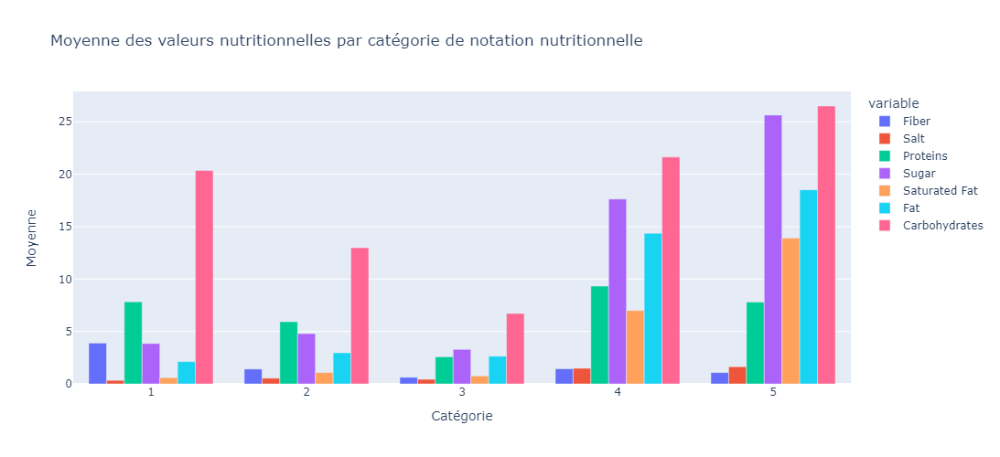

In [40]:
# Créez un DataFrame avec les moyennes
data = pd.DataFrame({
    'Category': ['1', '2', '3', '4', '5'],
    'Fiber': [moyenne_fiberA, moyenne_fiberB, moyenne_fiberC, moyenne_fiberD, moyenne_fiberE],
    'Salt': [moyenne_saltA, moyenne_saltB, moyenne_saltC, moyenne_saltD, moyenne_saltE],
    'Proteins': [moyenne_proteinsA, moyenne_proteinsB, moyenne_proteinsC, moyenne_proteinsD, moyenne_proteinsE],
    'Sugar': [moyenne_sugarA, moyenne_sugarB, moyenne_sugarC, moyenne_sugarD, moyenne_sugarE],
    'Saturated Fat': [moyenne_saturedfatA, moyenne_saturedfatB, moyenne_saturedfatC, moyenne_saturedfatD, moyenne_saturedfatE],
    'Fat': [moyenne_fatA, moyenne_fatB, moyenne_fatC, moyenne_fatD, moyenne_fatE],
    'Carbohydrates': [moyenne_carbohydratesA, moyenne_carbohydratesB, moyenne_carbohydratesC, moyenne_carbohydratesD, moyenne_carbohydratesE]
})

# Créez un graphique à barres avec Plotly Express
fig = px.bar(data, x='Category', y=['Fiber', 'Salt', 'Proteins', 'Sugar', 'Saturated Fat', 'Fat', 'Carbohydrates'],
             title='Moyenne des valeurs nutritionnelles par catégorie de notation nutritionnelle',
             labels={'value': 'Moyenne', 'Category': 'Catégorie'},
             barmode='group')
fig.update_layout(height=500)

# Affichez le graphique
fig.show()

In [41]:
# Calculer la moyenne des valeurs de A
med_fiberA = nutriA['fiber_100g'].median()
med_saltA = nutriA['salt_100g'].median()
med_proteinsA = nutriA['proteins_100g'].median()
med_sugarA = nutriA['sugars_100g'].median()
med_saturedfatA = nutriA['saturated-fat_100g'].median()
med_fatA = nutriA['fat_100g'].median()
med_carbohydratesA = nutriA['carbohydrates_100g'].median()

# Calculer la moyenne des valeurs de B
med_fiberB = nutriB['fiber_100g'].median()
med_saltB = nutriB['salt_100g'].median()
med_proteinsB = nutriB['proteins_100g'].median()
med_sugarB = nutriB['sugars_100g'].median()
med_saturedfatB = nutriB['saturated-fat_100g'].median()
med_fatB = nutriB['fat_100g'].median()
med_carbohydratesB = nutriB['carbohydrates_100g'].median()

# Calculer la moyenne des valeurs de C
med_fiberC = nutriC['fiber_100g'].median()
med_saltC = nutriC['salt_100g'].median()
med_proteinsC = nutriC['proteins_100g'].median()
med_sugarC = nutriC['sugars_100g'].median()
med_saturedfatC = nutriC['saturated-fat_100g'].median()
med_fatC = nutriC['fat_100g'].median()
med_carbohydratesC = nutriC['carbohydrates_100g'].median()

# Calculer la moyenne des valeurs de D
med_fiberD = nutriD['fiber_100g'].median()
med_saltD = nutriD['salt_100g'].median()
med_proteinsD = nutriD['proteins_100g'].median()
med_sugarD = nutriD['sugars_100g'].median()
med_saturedfatD = nutriD['saturated-fat_100g'].median()
med_fatD = nutriD['fat_100g'].median()
med_carbohydratesD = nutriD['carbohydrates_100g'].median()

# Calculer la moyenne des valeurs de E
med_fiberE = nutriE['fiber_100g'].median()
med_saltE = nutriE['salt_100g'].median()
med_proteinsE = nutriE['proteins_100g'].median()
med_sugarE = nutriE['sugars_100g'].median()
med_saturedfatE = nutriE['saturated-fat_100g'].median()
med_fatE = nutriE['fat_100g'].median()
med_carbohydratesE = nutriE['carbohydrates_100g'].median()

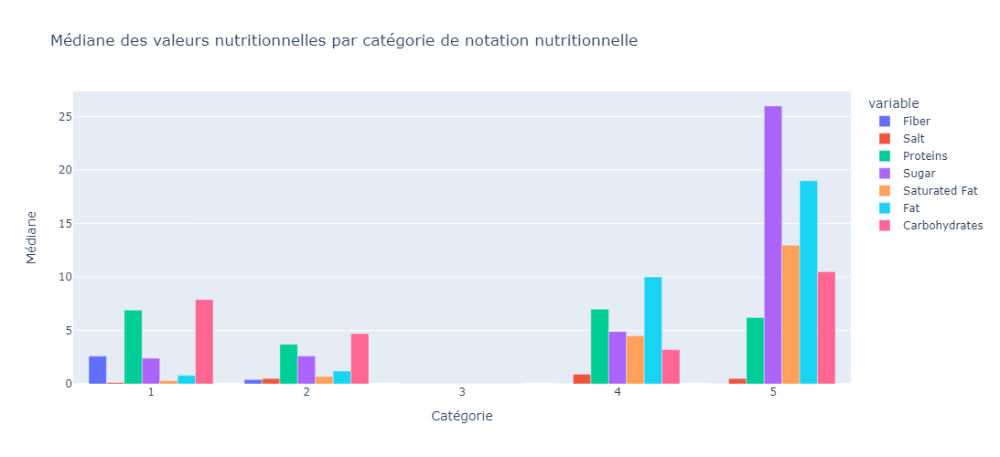

In [42]:
# Créez un DataFrame avec les moyennes
data = pd.DataFrame({
    'Category': ['1', '2', '3', '4', '5'],
    'Fiber': [med_fiberA, med_fiberB, med_fiberC, med_fiberD, med_fiberE],
    'Salt': [med_saltA, med_saltB, med_saltC, med_saltD, med_saltE],
    'Proteins': [med_proteinsA, med_proteinsB, med_proteinsC, med_proteinsD, med_proteinsE],
    'Sugar': [med_sugarA, med_sugarB, med_sugarC, med_sugarD, med_sugarE],
    'Saturated Fat': [med_saturedfatA, med_saturedfatB, med_saturedfatC, med_saturedfatD, med_saturedfatE],
    'Fat': [med_fatA, med_fatB, med_fatC, med_fatD, med_fatE],
    'Carbohydrates': [med_carbohydratesA, med_carbohydratesB, med_carbohydratesC, med_carbohydratesD, med_carbohydratesE]
})

# Créez un graphique à barres avec Plotly Express
fig = px.bar(data, x='Category', y=['Fiber', 'Salt', 'Proteins', 'Sugar', 'Saturated Fat', 'Fat', 'Carbohydrates'],
             title='Médiane des valeurs nutritionnelles par catégorie de notation nutritionnelle',
             labels={'value': 'Médiane', 'Category': 'Catégorie'},
             barmode='group')
fig.update_layout(height=500)

# Affichez le graphique
fig.show()

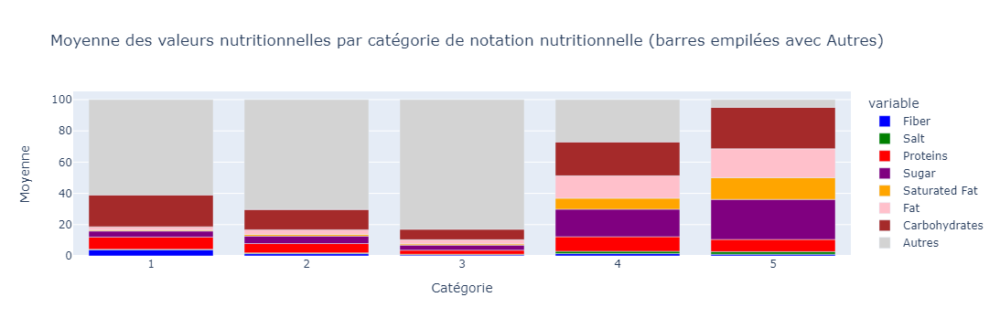

In [43]:
# Créez un DataFrame avec les moyennes
data = pd.DataFrame({
    'Category': ['1', '2', '3', '4', '5'],
    'Fiber': [moyenne_fiberA, moyenne_fiberB, moyenne_fiberC, moyenne_fiberD, moyenne_fiberE],
    'Salt': [moyenne_saltA, moyenne_saltB, moyenne_saltC, moyenne_saltD, moyenne_saltE],
    'Proteins': [moyenne_proteinsA, moyenne_proteinsB, moyenne_proteinsC, moyenne_proteinsD, moyenne_proteinsE],
    'Sugar': [moyenne_sugarA, moyenne_sugarB, moyenne_sugarC, moyenne_sugarD, moyenne_sugarE],
    'Saturated Fat': [moyenne_saturedfatA, moyenne_saturedfatB, moyenne_saturedfatC, moyenne_saturedfatD, moyenne_saturedfatE],
    'Fat': [moyenne_fatA, moyenne_fatB, moyenne_fatC, moyenne_fatD, moyenne_fatE],
    'Carbohydrates': [moyenne_carbohydratesA, moyenne_carbohydratesB, moyenne_carbohydratesC, moyenne_carbohydratesD, moyenne_carbohydratesE]
})

# Ajoutez la catégorie "Autres" avec les valeurs calculées
data['Autres'] = 100 - (data['Fiber'] + data['Salt'] + data['Proteins'] + data['Sugar'] + data['Saturated Fat'] + data['Fat'] + data['Carbohydrates'])

# Définissez vos couleurs personnalisées pour chaque catégorie
color_discrete_map = {
    'Fiber': 'blue',
    'Salt': 'green',
    'Proteins': 'red',
    'Sugar': 'purple',
    'Saturated Fat': 'orange',
    'Fat': 'pink',
    'Carbohydrates': 'brown',
    'Autres': 'lightgrey'
}

# Créez un graphique à barres avec Plotly Express en empilant les barres avec des couleurs personnalisées
fig = px.bar(data, x='Category', y=['Fiber', 'Salt', 'Proteins', 'Sugar', 'Saturated Fat', 'Fat', 'Carbohydrates', 'Autres'],
             title='Moyenne des valeurs nutritionnelles par catégorie de notation nutritionnelle (barres empilées avec Autres)',
             labels={'value': 'Moyenne', 'Category': 'Catégorie'},
             barmode='relative',
             color_discrete_map=color_discrete_map)

# Affichez le graphique
fig.show()

### Mise en place de l'ACP

In [44]:
data = {
    'NutriScore_Ref': ['nutriA', 'nutriB', 'nutriC', 'nutriD', 'nutriE'],
    'Fiber': [moyenne_fiberA, moyenne_fiberB, moyenne_fiberC, moyenne_fiberD, moyenne_fiberE],
    'Salt': [moyenne_saltA, moyenne_saltB, moyenne_saltC, moyenne_saltD, moyenne_saltE],
    'Proteins': [moyenne_proteinsA, moyenne_proteinsB, moyenne_proteinsC, moyenne_proteinsD, moyenne_proteinsE],
    'Sugar': [moyenne_sugarA, moyenne_sugarB, moyenne_sugarC, moyenne_sugarD, moyenne_sugarE],
    'Saturated Fat': [moyenne_saturedfatA, moyenne_saturedfatB, moyenne_saturedfatC, moyenne_saturedfatD, moyenne_saturedfatE],
    'Fat': [moyenne_fatA, moyenne_fatB, moyenne_fatC, moyenne_fatD, moyenne_fatE],
    'Carbohydrates': [moyenne_carbohydratesA, moyenne_carbohydratesB, moyenne_carbohydratesC, moyenne_carbohydratesD, moyenne_carbohydratesE],
    'Nbr_Allergenes': [moyenne_NbrAllA, moyenne_NbrAllB, moyenne_NbrAllC, moyenne_NbrAllD, moyenne_NbrAllE]
}

# Créez un DataFrame à partir du dictionnaire
dataACP = pd.DataFrame(data)

In [45]:
dataACP

,NutriScore_Ref,Fiber,Salt,Proteins,Sugar,Saturated Fat,Fat,Carbohydrates,Nbr_Allergenes
0,nutriA,3.892733,0.334642,7.833606,3.849247,0.593642,2.122280,20.350876,0.460389
1,nutriB,1.412619,0.541402,5.932953,4.789751,1.081784,2.964556,12.985573,0.660807
2,nutriC,0.624372,0.435004,2.579943,3.289309,0.765492,2.638679,6.716857,0.361093
3,nutriD,1.437635,1.486401,9.325572,17.629181,7.000948,14.367791,21.637729,0.757963
4,nutriE,1.076369,1.635915,7.796874,25.644025,13.899855,18.517448,26.508059,0.915911


### Convertir les colonne de textes en numériques.

In [46]:
names = dataFrance.nutrition_grade_fr
names

2        5.0
9        4.0
10       4.0
14       5.0
16       4.0
        ... 
90015    3.0
90016    3.0
90018    3.0
90019    3.0
90020    3.0
Name: nutrition_grade_fr, Length: 90021, dtype: float64

In [47]:
features = dataFrance[[ 'salt_100g', 'proteins_100g', 'fiber_100g', 'sugars_100g', 'saturated-fat_100g', 'fat_100g', 'energy-100g', 'carbohydrates_100g', 'Nbr_Allergenes']]
features

,salt_100g,proteins_100g,fiber_100g,sugars_100g,saturated-fat_100g,fat_100g,energy-100g,carbohydrates_100g,Nbr_Allergenes
2,0.09652,2.5,2.5,57.5,12.5,20.0,1883.0,70.0,0
9,0.01000,0.6,0.9,87.7,0.8,0.0,1753.0,0.0,0
10,0.00300,9.5,3.9,50.3,2.9,0.0,2406.0,0.0,0
14,0.02540,0.0,0.0,10.4,0.0,0.0,177.0,10.4,0
16,0.80000,7.5,1.4,1.0,11.0,0.0,1079.0,0.0,0
...,...,...,...,...,...,...,...,...,...
90015,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
90016,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
90018,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
90019,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [48]:
X = features.values

In [49]:
type(X)

numpy.ndarray

In [50]:
scaler = StandardScaler()

In [51]:
scaler.fit(X)

StandardScaler()

In [52]:
X_scaled = scaler.transform(X)
X_scaled[:]

array([[-0.19896155, -0.40047801,  0.34617888, ...,  0.09630808,
         2.30320052, -0.46284149],
       [-0.22351139, -0.65288072, -0.11220842, ...,  0.08436313,
        -0.59757392, -0.46284149],
       [-0.22549762,  0.52942669,  0.74726776, ...,  0.14436351,
        -0.59757392, -0.46284149],
       ...,
       [-0.22634886, -0.73258684, -0.37005128, ..., -0.07670986,
        -0.59757392, -0.46284149],
       [-0.22634886, -0.73258684, -0.37005128, ..., -0.07670986,
        -0.59757392, -0.46284149],
       [-0.22634886, -0.73258684, -0.37005128, ..., -0.07670986,
        -0.59757392, -0.46284149]])

In [53]:
idx = ["mean", "std"]

# Créer un DataFrame à partir de X_scaled et obtenir les statistiques descriptives
df_scaled = pd.DataFrame(X_scaled)
descriptive_stats = df_scaled.describe().round(2).loc[idx, :]

print(descriptive_stats)

        0    1    2    3    4    5    6    7    8
mean -0.0  0.0  0.0  0.0  0.0  0.0 -0.0 -0.0 -0.0
std   1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0


In [54]:
n_components = 9

In [55]:
pca = PCA(n_components=n_components)

In [56]:
pca.fit(X_scaled)

PCA(n_components=9)

In [57]:
pca.explained_variance_ratio_

array([0.2395205 , 0.15259573, 0.12455692, 0.11085426, 0.10500701,
       0.1000388 , 0.07359902, 0.05631327, 0.03751449])

In [58]:
scree = (pca.explained_variance_ratio_*100).round(2)
scree

array([23.95, 15.26, 12.46, 11.09, 10.5 , 10.  ,  7.36,  5.63,  3.75])

In [59]:
scree_cum = scree.cumsum().round()
scree_cum

array([ 24.,  39.,  52.,  63.,  73.,  83.,  91.,  96., 100.])

In [60]:
x_list = range(1, n_components+1)
list(x_list)

[1, 2, 3, 4, 5, 6, 7, 8, 9]

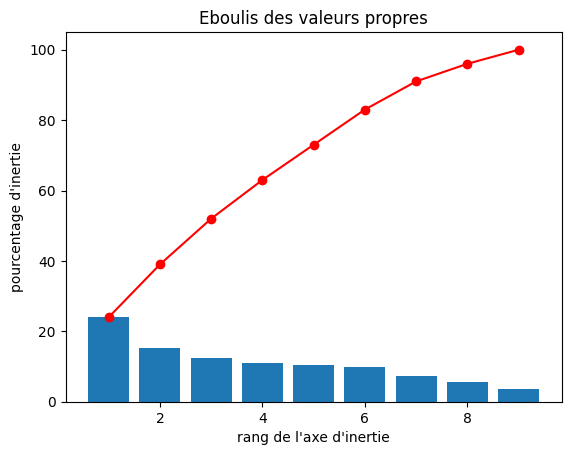

In [61]:
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
plt.show(block=False)

In [62]:
pcs = pca.components_

In [63]:
pcs = pd.DataFrame(pcs)
pcs

,0,1,2,3,4,5,6,7,8
0,0.082557,0.313090,0.235976,0.331404,0.451715,0.473764,0.084452,0.422386,0.340006
1,0.273039,0.390727,-0.075379,-0.544129,0.341494,0.303229,0.008412,-0.503000,-0.096841
2,0.413282,0.400137,0.649461,-0.034401,-0.298377,-0.348213,0.089679,0.090950,-0.139679
3,-0.258285,-0.031128,0.060687,0.022838,0.076398,0.018183,0.927211,-0.073980,-0.238234
4,0.660265,-0.127729,-0.438980,-0.026135,-0.195784,-0.067039,0.344390,0.103487,0.426859
5,-0.461076,0.200612,0.121240,-0.449151,-0.294766,-0.030816,0.078255,0.028754,0.660258
6,0.178889,-0.717936,0.541117,-0.210134,0.071238,0.264137,0.012016,-0.135313,0.149350
7,-0.023805,0.010027,0.107842,0.395704,0.370268,-0.473559,0.012729,-0.559438,0.395768
8,0.003451,-0.127030,-0.036212,-0.435007,0.563097,-0.512393,-0.000312,0.460455,-0.040806


In [64]:
pcs.features = features
pcs.names = [f"F{i}" for i in x_list]
pcs.round(2)

C:\Users\DELL\AppData\Local\Temp\ipykernel_23688\1896723240.py:1: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access

C:\Users\DELL\AppData\Local\Temp\ipykernel_23688\1896723240.py:2: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access



,0,1,2,3,4,5,6,7,8
0,0.08,0.31,0.24,0.33,0.45,0.47,0.08,0.42,0.34
1,0.27,0.39,-0.08,-0.54,0.34,0.30,0.01,-0.50,-0.10
2,0.41,0.40,0.65,-0.03,-0.30,-0.35,0.09,0.09,-0.14
3,-0.26,-0.03,0.06,0.02,0.08,0.02,0.93,-0.07,-0.24
4,0.66,-0.13,-0.44,-0.03,-0.20,-0.07,0.34,0.10,0.43
5,-0.46,0.20,0.12,-0.45,-0.29,-0.03,0.08,0.03,0.66
6,0.18,-0.72,0.54,-0.21,0.07,0.26,0.01,-0.14,0.15
7,-0.02,0.01,0.11,0.40,0.37,-0.47,0.01,-0.56,0.40
8,0.00,-0.13,-0.04,-0.44,0.56,-0.51,-0.00,0.46,-0.04


<Axes: >

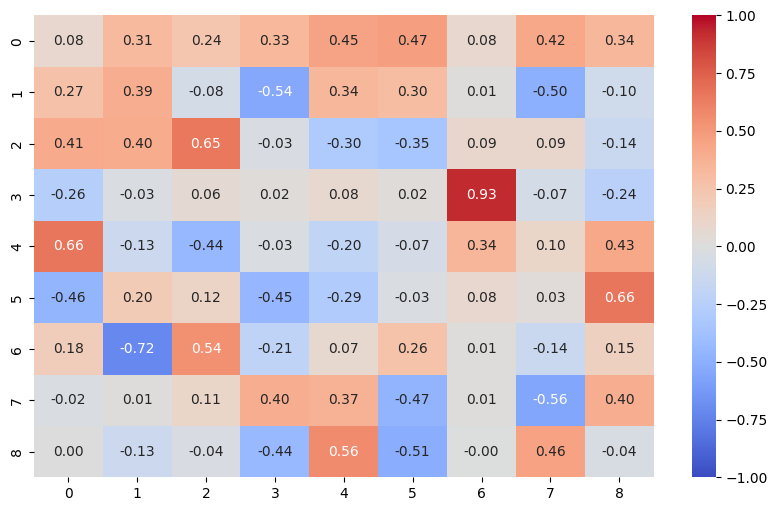

In [65]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(pcs, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

In [66]:
def correlation_graph(pca, x_y, features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """
    figsize = [10, 9]
    
    plt.style.use('ggplot')
    plt.close('all')
    fig, ax = plt.subplots(figsize=figsize)
    

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    #fig, ax = plt.subplots(figsize=(10, 9))

    num_components = min(pca.components_.shape[1], 5)

    for i in range(num_components):
        ax.arrow(0,
                 0,  
                 pca.components_[x, i],  # Utiliser x
                 pca.components_[y, i],  # Utiliser y
                 head_width=0.07,
                 head_length=0.07, 
                 width=0.02)
        plt.text(pca.components_[x, i] + 0.05,
                 pca.components_[y, i] + 0.05,
                 names[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire. Non c'est faux.
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show()

In [67]:
x_y = (0,1)
x_y

(0, 1)

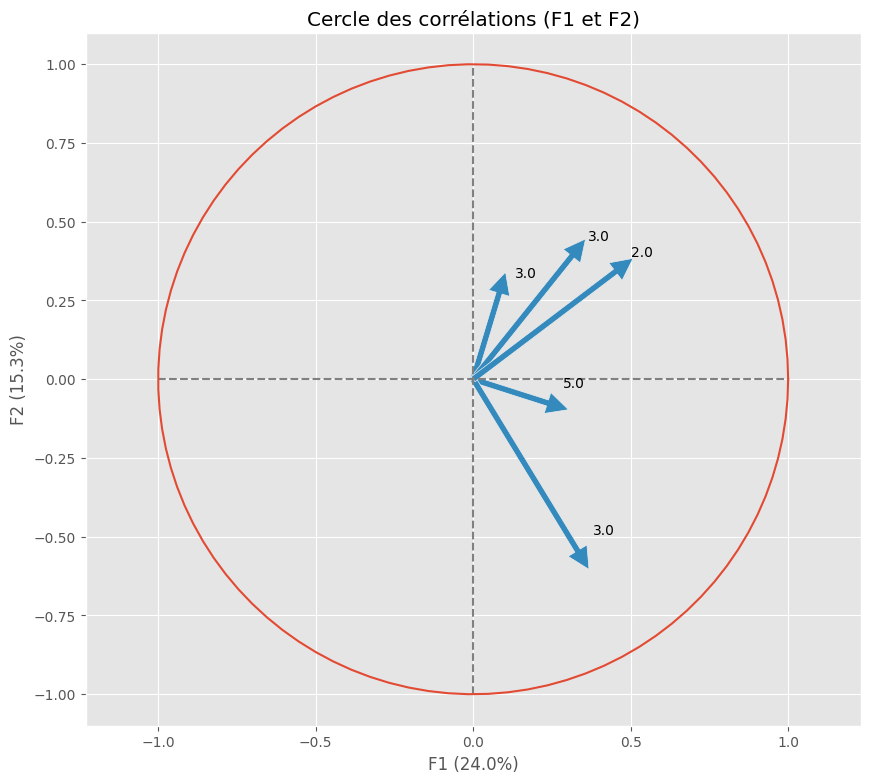

In [68]:
correlation_graph(pca, x_y, features)

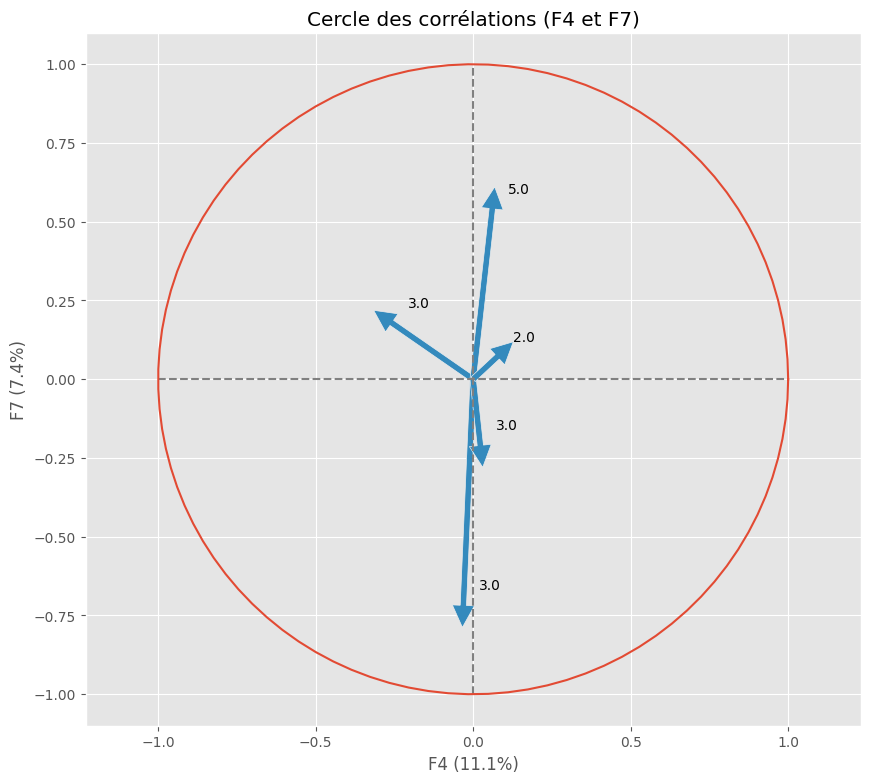

In [69]:
correlation_graph(pca, (3,6), features)

In [70]:
X_proj = pca.transform(X_scaled)
X_proj[:5]

array([[ 2.67482614, -2.20889516, -0.5073701 ,  0.28520278, -0.52418204,
        -1.82553523, -0.20558571, -0.32028103,  0.06363983],
       [ 0.46005121, -2.75609597, -0.27497864,  0.37011017, -0.25526742,
        -2.29693864, -0.7486712 ,  2.05602244, -2.13798033],
       [ 0.4363066 , -1.06739399,  0.75278871,  0.41284663, -0.76169178,
        -1.04552787, -0.65027193,  1.39559367, -1.205417  ],
       [-1.00913583, -0.54955357, -0.25818238,  0.07776608,  0.0053422 ,
        -0.2735251 ,  0.05661439, -0.0525514 , -0.004286  ],
       [-0.27895392,  0.88917098,  0.04075355,  0.22266325, -0.44208204,
        -0.31717132, -0.12230689,  0.5629482 ,  0.72434009]])

In [71]:
def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """
    plt.close('all')
    
    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
                        c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # j'ai copié collé la fonction sans la lire.C'est faux!
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
    plt.show()



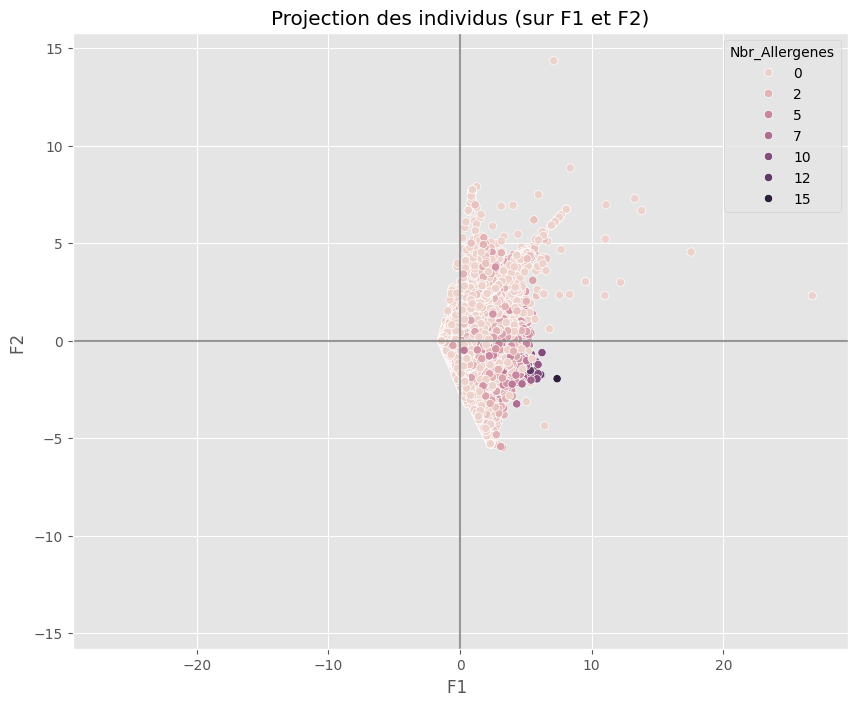

In [72]:
x_y = [0,1]
display_factorial_planes(X_proj, x_y, clusters=dataFrance['Nbr_Allergenes'])

In [73]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Création du modèle OLS pour ANOVA avec 'Nbr_Allergenes' comme variable dépendante
model = ols('Nbr_Allergenes ~ C(nutrition_grade_fr)', data=dataFrance).fit()

# Réalisation de l'ANOVA et affichage du tableau de résultats
anova_results = sm.stats.anova_lm(model, typ=2)
print(anova_results)


                              sum_sq       df          F  PR(>F)
C(nutrition_grade_fr)    4026.211249      4.0  726.13619     0.0
Residual               124778.050157  90016.0        NaN     NaN


C:\Users\DELL\AppData\Local\Temp\ipykernel_23688\2017539571.py:5: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.




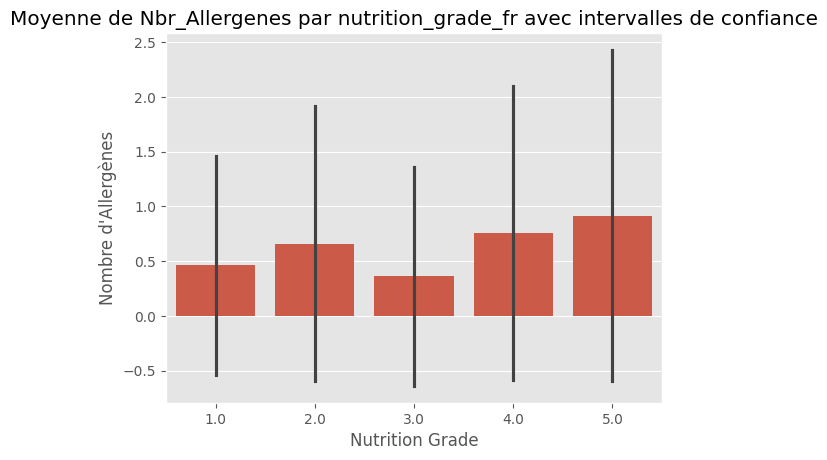

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt

# Créer un graphique à barres avec intervalles de confiance
sns.barplot(x='nutrition_grade_fr', y='Nbr_Allergenes', data=dataFrance, ci='sd')

# Ajouter des titres et étiquettes
plt.title('Moyenne de Nbr_Allergenes par nutrition_grade_fr avec intervalles de confiance')
plt.xlabel('Nutrition Grade')
plt.ylabel('Nombre d\'Allergènes')

# Afficher le graphique
plt.show()

In [75]:
# Remplacez les valeurs booléennes True/False par 'oui'/'non'
dataFrance['PresenceAllergenes'] = dataFrance['PresenceAllergenes'].replace({True: '1', False: '0'})
dataFrance['PresenceAllergenes'] = dataFrance['PresenceAllergenes'].astype(int)


In [76]:
# Création du modèle OLS pour ANOVA avec 'Nbr_Allergenes' comme variable dépendante
model = ols('fiber_100g ~ C(nutrition_grade_fr)', data=dataFrance).fit()

# Réalisation de l'ANOVA et affichage du tableau de résultats
anova_results = sm.stats.anova_lm(model, typ=2)
print(anova_results)


                             sum_sq       df            F  PR(>F)
C(nutrition_grade_fr)  8.826124e+04      4.0  1969.458021     0.0
Residual               1.008517e+06  90016.0          NaN     NaN


C:\Users\DELL\AppData\Local\Temp\ipykernel_23688\382293276.py:5: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.




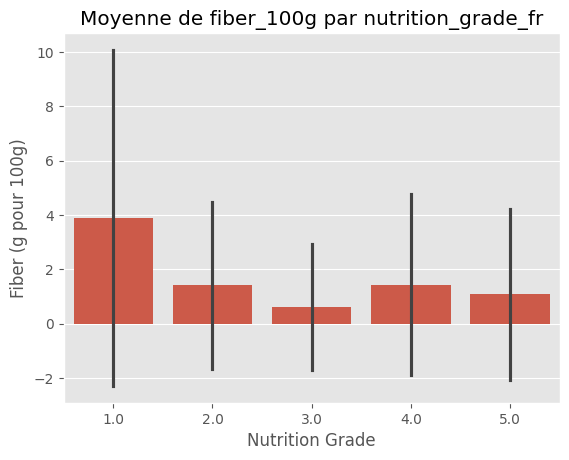

In [77]:
import seaborn as sns
import matplotlib.pyplot as plt

# Créer un graphique à barres
sns.barplot(x='nutrition_grade_fr', y='fiber_100g', data=dataFrance, ci='sd')

# Ajouter des titres et étiquettes
plt.title('Moyenne de fiber_100g par nutrition_grade_fr')
plt.xlabel('Nutrition Grade')
plt.ylabel('Fiber (g pour 100g)')

# Afficher le graphique
plt.show()


In [78]:
# Création du modèle OLS pour ANOVA avec 'Nbr_Allergenes' comme variable dépendante
model = ols('sugars_100g ~ C(nutrition_grade_fr)', data=dataFrance).fit()

# Réalisation de l'ANOVA et affichage du tableau de résultats
anova_results = sm.stats.anova_lm(model, typ=2)
print(anova_results)


                             sum_sq       df            F  PR(>F)
C(nutrition_grade_fr)  6.395870e+06      4.0  7315.119848     0.0
Residual               1.967605e+07  90016.0          NaN     NaN


C:\Users\DELL\AppData\Local\Temp\ipykernel_23688\3009035323.py:5: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.




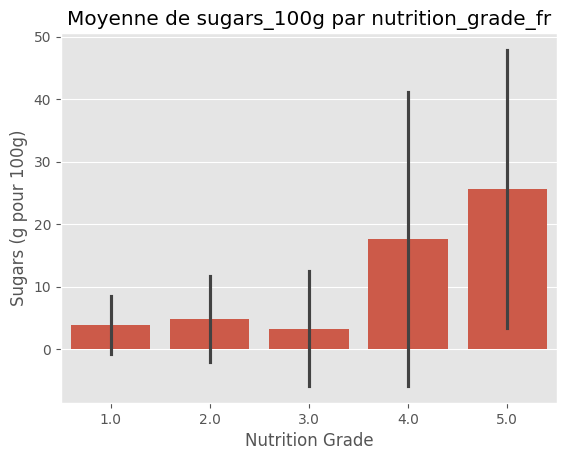

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

# Créer un graphique à barres
sns.barplot(x='nutrition_grade_fr', y='sugars_100g', data=dataFrance, ci='sd')

# Ajouter des titres et étiquettes
plt.title('Moyenne de sugars_100g par nutrition_grade_fr')
plt.xlabel('Nutrition Grade')
plt.ylabel('Sugars (g pour 100g)')

# Afficher le graphique
plt.show()


In [80]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Assurez-vous que 'nutrition_grade_fr' est traité comme une variable catégorielle
dataFrance['nutrition_grade_fr'] = dataFrance['nutrition_grade_fr'].astype('category')

# Créer un modèle OLS en utilisant 'Nbr_Allergenes' comme variable dépendante
# et les variables indicatrices pour 'nutrition_grade_fr' comme prédicteurs.
# Patsy (la bibliothèque utilisée par statsmodels pour interpréter les formules)
# crée automatiquement des variables indicatrices pour les variables catégorielles.
model = ols('Nbr_Allergenes ~ C(nutrition_grade_fr)', data=dataFrance).fit()

# Afficher un résumé des résultats de la régression
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:         Nbr_Allergenes   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     726.1
Date:                Fri, 09 Feb 2024   Prob (F-statistic):               0.00
Time:                        16:52:57   Log-Likelihood:            -1.4243e+05
No. Observations:               90021   AIC:                         2.849e+05
Df Residuals:                   90016   BIC:                         2.849e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

In [81]:
# Assurez-vous que 'nutrition_grade_fr' est traité comme une variable catégorielle
dataFrance['nutrition_grade_fr'] = dataFrance['nutrition_grade_fr'].astype('category')

# Créer un modèle OLS en utilisant 'Nbr_Allergenes' comme variable dépendante
# et les variables indicatrices pour 'nutrition_grade_fr' comme prédicteurs.
# Patsy (la bibliothèque utilisée par statsmodels pour interpréter les formules)
# crée automatiquement des variables indicatrices pour les variables catégorielles.
model = ols('fiber_100g ~ C(nutrition_grade_fr)', data=dataFrance).fit()

# Afficher un résumé des résultats de la régression
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:             fiber_100g   R-squared:                       0.080
Model:                            OLS   Adj. R-squared:                  0.080
Method:                 Least Squares   F-statistic:                     1969.
Date:                Fri, 09 Feb 2024   Prob (F-statistic):               0.00
Time:                        16:52:57   Log-Likelihood:            -2.3649e+05
No. Observations:               90021   AIC:                         4.730e+05
Df Residuals:                   90016   BIC:                         4.730e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

In [82]:
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Assurez-vous que votre DataFrame est correctement configuré avec 'Nbr_Allergenes' comme variable quantitative
# et 'nutrition_grade_fr' comme facteur catégoriel.

# Effectuer le test de Tukey HSD
tukey = pairwise_tukeyhsd(endog=dataFrance['Nbr_Allergenes'],     # Data
                          groups=dataFrance['nutrition_grade_fr'],  # Catégories
                          alpha=0.05)                            # Niveau de signification

# Afficher les résultats du test de Tukey
print(tukey.summary())


Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
   1.0    2.0   0.2004   0.0  0.1542  0.2466   True
   1.0    3.0  -0.0993   0.0 -0.1348 -0.0637   True
   1.0    4.0   0.2976   0.0  0.2575  0.3377   True
   1.0    5.0   0.4555   0.0  0.4123  0.4988   True
   2.0    3.0  -0.2997   0.0 -0.3367 -0.2627   True
   2.0    4.0   0.0972   0.0  0.0558  0.1385   True
   2.0    5.0   0.2551   0.0  0.2106  0.2996   True
   3.0    4.0   0.3969   0.0  0.3678  0.4259   True
   3.0    5.0   0.5548   0.0  0.5215  0.5881   True
   4.0    5.0   0.1579   0.0  0.1198  0.1961   True
---------------------------------------------------


In [83]:
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Assurez-vous que votre DataFrame est correctement configuré avec 'Nbr_Allergenes' comme variable quantitative
# et 'nutrition_grade_fr' comme facteur catégoriel.

# Effectuer le test de Tukey HSD
tukey = pairwise_tukeyhsd(endog=dataFrance['fiber_100g'],     # Data
                          groups=dataFrance['nutrition_grade_fr'],  # Catégories
                          alpha=0.05)                            # Niveau de signification

# Afficher les résultats du test de Tukey
print(tukey.summary())


Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   1.0    2.0  -2.4801    0.0 -2.6114 -2.3488   True
   1.0    3.0  -3.2684    0.0 -3.3694 -3.1673   True
   1.0    4.0  -2.4551    0.0 -2.5691 -2.3411   True
   1.0    5.0  -2.8164    0.0 -2.9394 -2.6934   True
   2.0    3.0  -0.7882    0.0 -0.8934  -0.683   True
   2.0    4.0    0.025 0.9781 -0.0927  0.1427  False
   2.0    5.0  -0.3363    0.0 -0.4627 -0.2098   True
   3.0    4.0   0.8133    0.0  0.7307  0.8959   True
   3.0    5.0    0.452    0.0  0.3574  0.5466   True
   4.0    5.0  -0.3613    0.0 -0.4696 -0.2529   True
----------------------------------------------------
